# 1 Author

**Student Name**:  Sivasankari Rajamanickam

**Student ID**:  210965243



# 2 Problem formulation

The MLEnd Hums and Whistles Dataset consists of audios of eight different songs:

*   Potter
*   Starwars
*   Panther
*   Rain
*   Hakuna
*   Mamma
*   Showman
*   Rain

The demography data consists of demographic information of the contributors to the audio set. This data consists of gender information. 

Hence, we use this demographic data and build a ML Model to predict whether the person who hummed or whistled is male or female.

We train the model using the Audio Dataset consisting of 8 songs.


# 3 Machine Learning pipeline


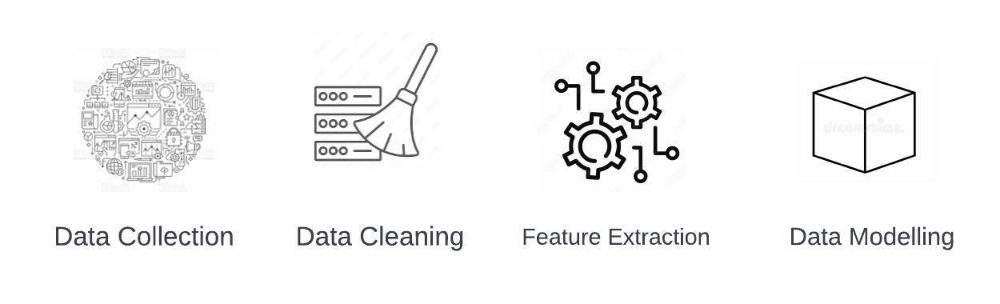

*   **Data Collection**

      The MLEnd Hums and Whistles Dataset is available in the Queen Mary Repository. We get the link for each song's dataset, develop an algorithm that downloads the zip file that contains all the data in .wav format and extracts it to the specified folder.

*   **Data Cleaning**

      The file names of the audio files extracted are then manipulated to suit a common format, thus preparing the names for further analysis and modelling.

*   **Feature Extraction**

      Each audio file is approximately 15 seconds long. To train the model, we snip each audio file into smaller samples. We then extract features from each audio file, namely power, pitch mean, pitch standard deviation, and the fraction of voiced region.


*   **Data Modelling**

      The dataset is divided into training and validation datasets. The features extracted from the audio files are fit into multiple algorithms and are trained and predicted against the split datasets for the same.

# 4 Transformation stage
This stage mainly focuses on extracting features from each song:

*   Power
*   Pitch Mean
*   Pitch Standard Deviation
*   Fraction of voiced region

The ML model is trained on a graph with the X and y-axis.

The features extracted are flattened into a 1D array, which will form the X-axis of the graph. The y-axis will take two Boolean values: 

*   True if the gender is **Male**
*   False if the gender is **Female**

The graph is then plotted with the generated X and y values.

# 5 Modelling - Gaussian Process Classifier

We use Multiple classifier algorithms namely:


*   Support Vector Machine
*   Random Forest Classifier
*   Decision Tree Classifier
*   Gaussian Process Classifier   

On a conclusion, we note that Gaussian Process Classifier renders highest accuracy and 

The Gaussian Processes Classifier is a machine learning classification technique.

 Gaussian processes are a generalisation of the Gaussian probability distribution that may be used to create advanced non-parametric machine learning algorithms for classification and regression.


# 6 Methodology

The dataset is split into training and validation dataset. (80% for training and 20% for Validation)

These dataset are then fed to train and validate the model developed using above mentioned algorithms.

The following methodology is used to improve accuracy:
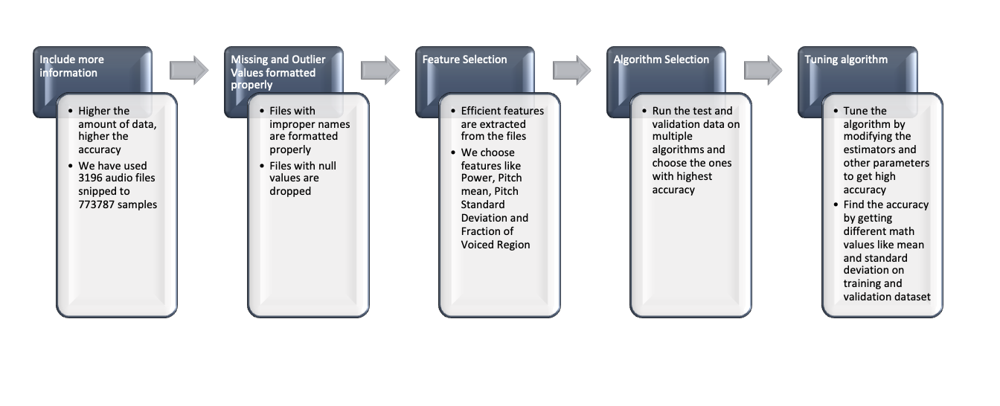

# 7 Dataset

The MLEnd Hums and Whistles dataset is used to perform this Machine Learning Project.

The Dataset consists of 8 songs:

1.   Potter
2.   Starwars
3.   Panther 
4.   Rain
5.   Hakuna
6.   Mamma
7.   Showman
8.   Frozen

Each song has been hummed and whistled and stored in the repository. This Dataset is available as *.zip* file.

The demography dataset consists of demographic information of contributors (Participant ID, Gender, Coordinates of region, Languuage)

**Data Collection :** We download the zip file for all songs and store them in Google Drive. 

**Data Extraction:**  The zip file is then extracted to get the audios.
Each audio file is in the *.wav* format.
We also extract the demography file which is in *.csv* format and store it as pandas dataframe.

**Data Cleaning:** The files' names are not in proper format. We define an algorithm to fit all file names under a specific format to make proper contribution for analysis and training

**DataFrame Extraction:** Create a table from the file names and convert the table to a dataframe. This dataframe is then joined with the demographic data on a common key (Participant ID)




## 7.1 Environment Setup

In [1]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Mounted at /content/drive


## 7.2 Data Collection
Download the data from the specified URL and store it in Google Drive

In [64]:
def download_url(url, save_path):
    with urllib.request.urlopen(url) as dl_file:
        with open(save_path, 'wb') as out_file:
            out_file.write(dl_file.read())

In [9]:
url  = "https://collect.qmul.ac.uk/down?t=6P0I5CAE7JPPKNDU/4P729FD6DFNO8IT4NNFR458"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Potter1.zip'
download_url(url, save_path)

In [10]:
url  = "https://collect.qmul.ac.uk/down?t=452THMOKUOST11V4/4L7IBFL5AJ3AMR45JVV9AC0"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Potter2.zip'
download_url(url, save_path)

In [11]:
url  = "https://collect.qmul.ac.uk/down?t=4HOGB7IH67J8QGL3/5D5TJMIP30DFVC69AQU5ETO"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_StarWars1.zip'
download_url(url, save_path)

In [12]:
url  = "https://collect.qmul.ac.uk/down?t=4LUHB7IH67J8QGL3/6T5IF3SK8KQTL7FRD2113DO"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_StarWars2.zip'
download_url(url, save_path)

In [8]:
url  = "https://collect.qmul.ac.uk/down?t=6P5DHMOKUOST11V4/45V197K56GJCN375FM97GKO"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Panther1.zip'
download_url(url, save_path)

In [9]:
url  = "https://collect.qmul.ac.uk/down?t=556JF9IP9676AAIB/450D7KAI0S5U15VGE2A7MKO"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Panther2.zip'
download_url(url, save_path)

In [10]:
url  = "https://collect.qmul.ac.uk/down?t=610DVT8AV0VTD6FQ/4PSHB4CI8V5Q0LTGMBBBVO0"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Rain1.zip'
download_url(url, save_path)

In [11]:
url  = "https://collect.qmul.ac.uk/down?t=5163F9QO9A6M8AQ8/6P0T9MQO34CVTCEEA6K4AR8"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Rain2.zip'
download_url(url, save_path)

In [12]:
url  = "https://collect.qmul.ac.uk/down?t=555I92D6GH5I5L9M/59UH97479B4AQOLUKB0QI08"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Hakuna1.zip'
download_url(url, save_path)

In [13]:
url  = "https://collect.qmul.ac.uk/down?t=6TF3DEBMAIDN49A6/6L4DRTRS7KUT51CTGADNEN8"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Hakuna2.zip'
download_url(url, save_path)

In [14]:
url  = "https://collect.qmul.ac.uk/down?t=554DRGJTDMH4I3JF/595DLIDADVHOGJTBM3BRS68"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Mamma1.zip'
download_url(url, save_path)

In [15]:
url  = "https://collect.qmul.ac.uk/down?t=4HVHB72J6VS9UK5D/610DRSJH409EFA60BQVQQ20"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Mamma2.zip'
download_url(url, save_path)

In [16]:
url  = "https://collect.qmul.ac.uk/down?t=5942PCQC7ROPGNTS/6PF33CLHC39AEQ41JJS9AC8"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Showman1.zip'
download_url(url, save_path)

In [17]:
url  = "https://collect.qmul.ac.uk/down?t=6132RDI977V9AMLR/6L7J7ETOF7SPSKDEMB5Q81G"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Showman2.zip'
download_url(url, save_path)

In [4]:
url  = "https://collect.qmul.ac.uk/down?t=4LV194DEJH9JLV8U/652DJI5BDRM82DIIPKKCFQ0"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Frozen1.zip'
download_url(url, save_path)

In [5]:
url  = "https://collect.qmul.ac.uk/down?t=6TDILDI977V9AMLR/6P4TPGT0A70LC6BHTK7VPMG"
save_path = '/content/drive/MyDrive/Data/Advanced/MLEndHW_Frozen2.zip'
download_url(url, save_path)

In [65]:
path = '/content/drive/MyDrive/Data/Advanced'
os.listdir(path)

['MLEndHWD_Demographics_Miniproject.csv',
 'MLEndHW_Panther1.zip',
 'MLEndHW_Panther2.zip',
 'MLEndHW_Rain1.zip',
 'MLEndHW_Rain2.zip',
 'MLEndHW_Hakuna1.zip',
 'MLEndHW_Hakuna2.zip',
 'MLEndHW_Mamma1.zip',
 'MLEndHW_Mamma2.zip',
 'MLEndHW_Showman1.zip',
 'MLEndHW_Showman2.zip',
 'MLEndHW_Frozen1.zip',
 'MLEndHW_Frozen2.zip',
 'MLEndHW_Potter1.zip',
 'MLEndHW_Potter2.zip',
 'MLEndHW_StarWars1.zip',
 'MLEndHW_StarWars2.zip',
 'Dataset']

## 7.3 Data Extraction
Extract the *.wav* audio files from the zip file to the specified Google Drive Location.

In [14]:
def zip_extract(extract_to,zip_path):
  with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

In [16]:
directory_to_extract_to = '/content/drive/MyDrive/Data/Advanced/Dataset/'
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Potter1.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Potter2.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_StarWars1.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_StarWars2.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Panther1.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Panther2.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Rain1.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Rain2.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Hakuna1.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Hakuna2.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Mamma1.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Mamma2.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Showman1.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Showman2.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Frozen1.zip')
zip_extract(directory_to_extract_to,'/content/drive/MyDrive/Data/Advanced/MLEndHW_Frozen2.zip')

In [2]:
sample_path = '/content/drive/MyDrive/Data/Advanced/Dataset/*.wav'
files = glob.glob(sample_path)
len(files)

3196

In [67]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

## 7.4 Data Cleaning and Dataframe Creation

The files with incorrect filenames are filtered down and manipulated to fit into proper names.

Properties like *File ID*, *File name*, *Interpretation Type*(Hum or Whistle) and *Song Name* are taken from the cleaned file name and appended into a Table.

This table which is in the list type is converted into **Pandas Dataframe** which contains the meta data of files.

In [4]:
MLENDHW_table = [] 
starwars_matches = ['star','stat','imperial']
whistle_matches = ['whistle','whisle','whislte','wistle']
hum_matches = ['hum','ham','hun']
panther_matches = ['panther','panter']
hakuna_matches = ['hakuna','hukuna','hakana','haknua']
mamma_matches = ['mamma','mumma','mama','mamia']
showman_matches = ['showman','snowman','this']
frozen_matches = ['frozen','let']

i = 0
for file in files:
  file_name = file.split('/')[-1]
  file_name1 = file_name.lower()

  participant_ID = file.split('/')[-1].split('_')[0]

  #SONG NAME
  if any(x in file_name1 for x in starwars_matches):
    song = "StarWars"
  elif "potter" in file_name1:
    song = "Potter"
  elif any(x in file_name1 for x in panther_matches):
    song = "Panther"
  elif "rain" in file_name1:
    song = "Rain"
  elif any(x in file_name1 for x in hakuna_matches):
    song = "Hakuna"
  elif any(x in file_name1 for x in mamma_matches):
    song = "Mamma"
  elif any(x in file_name1 for x in showman_matches):
    song = "Showman"
  elif any(x in file_name1 for x in frozen_matches):
    song = "Frozen"
  else:
    song = "None"

  
  #INTERPRETATION TYPE
  if any(x in file_name1 for x in hum_matches):
    interpretation_type = "Hum"
  elif any(x in file_name1 for x in whistle_matches):
    interpretation_type = "Whistle"
  else:
    interpretation_type = "None"

  if song == 'None' or interpretation_type == 'None':
    pass
  else:
    file_id = i
    i+=1
    MLENDHW_table.append([file_id,participant_ID,file_name,song,interpretation_type])

MLENDHW_table

[[0, 'S133', 'S133_hum_2_mamma.wav', 'Mamma', 'Hum'],
 [1, 'S133', 'S133_whistle_2_mamma.wav', 'Mamma', 'Whistle'],
 [2, 'S134', 'S134_hum_1_[Mamma].wav', 'Mamma', 'Hum'],
 [3, 'S134', 'S134_whistle_2_[Mamma].wav', 'Mamma', 'Whistle'],
 [4, 'S135', 'S135_hum_2_Mamma.wav', 'Mamma', 'Hum'],
 [5, 'S135', 'S135_whistle_2_Mamma.wav', 'Mamma', 'Whistle'],
 [6, 'S136', 'S136_hum_2_Mamma.wav', 'Mamma', 'Hum'],
 [7, 'S136', 'S136_hum_3_Mamma.wav', 'Mamma', 'Hum'],
 [8, 'S137', 'S137_hum_2_Mamma.wav', 'Mamma', 'Hum'],
 [9, 'S137', 'S137_hum_3_Mamma.wav', 'Mamma', 'Hum'],
 [10, 'S138', 'S138_hum_2_Mamma.wav', 'Mamma', 'Hum'],
 [11, 'S138', 'S138_whistle_2_Mamma.wav', 'Mamma', 'Whistle'],
 [12, 'S140', 'S140_hum_2_Mamma.wav', 'Mamma', 'Hum'],
 [13, 'S140', 'S140_whistle_2_Mamma.wav', 'Mamma', 'Whistle'],
 [14, 'S141', 'S141_hum_1_mamma_mia.wav', 'Mamma', 'Hum'],
 [15, 'S141', 'S141_hum_2_mamma_mia.wav', 'Mamma', 'Hum'],
 [16, 'S142', 'S142_hum_2_Mamma.wav', 'Mamma', 'Hum'],
 [17, 'S142', 'S142_whi

In [5]:
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','ID','file_name','song','interpretation'])
MLENDHW_df

,file_id,ID,file_name,song,interpretation
0,0,S133,S133_hum_2_mamma.wav,Mamma,Hum
1,1,S133,S133_whistle_2_mamma.wav,Mamma,Whistle
2,2,S134,S134_hum_1_[Mamma].wav,Mamma,Hum
3,3,S134,S134_whistle_2_[Mamma].wav,Mamma,Whistle
4,4,S135,S135_hum_2_Mamma.wav,Mamma,Hum
...,...,...,...,...,...
3191,3191,S176,S176_hum_2_Potter.wav,Potter,Hum
3192,3192,S176,S176_whistle_2_Potter.wav,Potter,Whistle
3193,3193,S177,S177_hum_1_Potter.wav,Potter,Hum
3194,3194,S177,S177_hum_2_Potter.wav,Potter,Hum


In [6]:
path = '/content/drive/MyDrive/Data/Advanced/MLEndHWD_Demographics_Miniproject.csv'
MLEnd_demography_df = pd.read_csv(path)
MLEnd_demography_df

,ID,Language1,Language2,Age,Nationality,Coordinates,Gender
0,S76,Hindi,English,20-24,Indian,"(40.60, -122.40)",Female
1,S217,NaN,NaN,NaN,NaN,NaN,Female
2,S221,Malayalam,Hindi,25-29,Indian,"(11.8745, 75.3704)",Female
3,S173,Akan,English,50-59,Ghanaian,"(5.6037, -0.1870)",Male
4,S115,Hindi,English,20-24,Indian,"(28.7041, 77.1025)",Male
...,...,...,...,...,...,...,...
270,S243,NaN,NaN,NaN,NaN,NaN,NaN
271,S225,NaN,NaN,NaN,NaN,NaN,NaN
272,S248,NaN,NaN,NaN,NaN,NaN,NaN
273,S244,English,Hindi,25-29,Indian,"(51.52, -0.04)",Female


In [7]:
#inner join on dataframes with primary key being ID
MLEND_df = MLENDHW_df.merge(MLEnd_demography_df, how = 'inner', on = ['ID'])
MLEND_df

,file_id,ID,file_name,song,interpretation,Language1,Language2,Age,Nationality,Coordinates,Gender
0,0,S133,S133_hum_2_mamma.wav,Mamma,Hum,English,Urdu,20-24,British,"(51.5072, 0.1276)",Male
1,1,S133,S133_whistle_2_mamma.wav,Mamma,Whistle,English,Urdu,20-24,British,"(51.5072, 0.1276)",Male
2,412,S133,S133_hum_1_showman.wav,Showman,Hum,English,Urdu,20-24,British,"(51.5072, 0.1276)",Male
3,413,S133,S133_whistle_2_showman.wav,Showman,Whistle,English,Urdu,20-24,British,"(51.5072, 0.1276)",Male
4,820,S133,S133_hum_2_Frozen.wav,Frozen,Hum,English,Urdu,20-24,British,"(51.5072, 0.1276)",Male
...,...,...,...,...,...,...,...,...,...,...,...
3191,3047,S96,S96_whistle_1_[Potter].wav,Potter,Whistle,NaN,NaN,NaN,NaN,NaN,NaN
3192,1989,S183,S183_hum_2_Potter.wav,Potter,Hum,NaN,NaN,NaN,NaN,NaN,NaN
3193,1990,S183,S183_whistle_2_Potter.wav,Potter,Whistle,NaN,NaN,NaN,NaN,NaN,NaN
3194,2155,S50,S50_hum_2_StarWars.wav,StarWars,Hum,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
#Drop all null values
MLEND_df = MLEND_df.dropna(subset=['Gender'])
MLEND_df

,file_id,ID,file_name,song,interpretation,Language1,Language2,Age,Nationality,Coordinates,Gender
0,0,S133,S133_hum_2_mamma.wav,Mamma,Hum,English,Urdu,20-24,British,"(51.5072, 0.1276)",Male
1,1,S133,S133_whistle_2_mamma.wav,Mamma,Whistle,English,Urdu,20-24,British,"(51.5072, 0.1276)",Male
2,412,S133,S133_hum_1_showman.wav,Showman,Hum,English,Urdu,20-24,British,"(51.5072, 0.1276)",Male
3,413,S133,S133_whistle_2_showman.wav,Showman,Whistle,English,Urdu,20-24,British,"(51.5072, 0.1276)",Male
4,820,S133,S133_hum_2_Frozen.wav,Frozen,Hum,English,Urdu,20-24,British,"(51.5072, 0.1276)",Male
...,...,...,...,...,...,...,...,...,...,...,...
3179,2307,S132,S132_whistle_2_StarWars.wav,StarWars,Whistle,English,Dhivehi,20-24,British,"(4.225372, 73.519459)",Male
3180,2719,S132,S132_hum_2_Panther.wav,Panther,Hum,English,Dhivehi,20-24,British,"(4.225372, 73.519459)",Male
3181,2720,S132,S132_whistle_1_Panther.wav,Panther,Whistle,English,Dhivehi,20-24,British,"(4.225372, 73.519459)",Male
3182,3107,S132,S132_hum_2_Potter.wav,Potter,Hum,English,Dhivehi,20-24,British,"(4.225372, 73.519459)",Male


In [10]:
#get a list of all unique file names that has proper genders
files_with_gender = MLEND_df.file_name.unique().tolist()
len(files_with_gender)

2210

# 8 Results



## 8.1 Feature Extraction
Audio files are approximately 15 seconds long. Each audio files is sampled into smaller snippets. Here we acquire 773787 samples from 2210 audio files(after cleaning).

We then extract features - power, pitch mean, pitch standard deviation and fraction of voiced region for each sample.

These features are used to identify each songs.

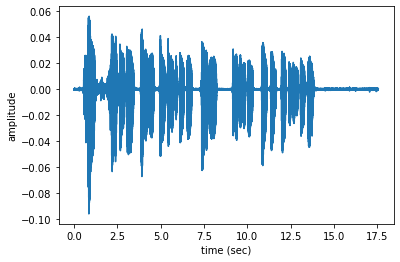

In [11]:
n=0
fs = None # Sampling frequency. If None, fs would be 22050
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

In [13]:
#modify the file list that has path, as certain audio doesnt have gender
new_file = files
files = []
for file in new_file:
  file_name = file.split('/')[-1]
  if file_name in files_with_gender:
    files.append(file)
len(files)

2210

In [15]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 773787 samples


This cell defines an algorithm to get the pitch value. The function takes three arguments as inputs:
* ***x*** - samples of audio files
* ***fs*** - sample frequency
* ***winLen*** - autocorrelation of samples. This value is set to a default value of 0.2.

The output of the function is as follows:
* ***f0*** - a series that contains the fundamental frequencies. This is in Hertz.
* ***voiced_flag*** - Series of boolean values indicating if the frame is flagged

In [16]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

The following function defines an algorithm to generate the features -X and labels- y values for training and validating the ML Model.

The input to the function is as follows:

* ***files*** - a list of paths to the audio files
* ***labels_files*** - data frame that consists of metadata (file ID, file name, interpretation type, song) of each audio file.
* ***scale_audio*** - the audio samples are scaled between -1 and 1 if set as True and samples are retained with the original value if set to False. This value is defaulted to *False*.
* ***onlySingleDigit*** - accepts only single digits if set to True. This value is defaulted to *False*.

The function returns the following values:

* ***X*** - NumPy array of 4 extracted features
* ***y*** - NumPy array of labels (1 - Male, 0 - Female)

In [17]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    a = MLEND_df.index[MLEND_df['file_name'] == file.split('/')[-1]].tolist()
    yi = MLEND_df.loc[a]['Gender']=='Male'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power,pitch_mean,pitch_std,voiced_fr]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

In [18]:
X,y = getXy(files, labels_file=MLEND_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 2210/2210 [1:54:56<00:00,  3.12s/it]


In [106]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)

The shape of X is (2210, 4)
The shape of y is (2210, 1)
The labels vector is [[ True]
 [ True]
 [ True]
 ...
 [False]
 [False]
 [False]]


In [107]:
print(' The number of Male recordings is ', np.count_nonzero(y))
print(' The number of Female recordings is ', y.size - np.count_nonzero(y))

 The number of Male recordings is  1446
 The number of Female recordings is  764


## 8.2 Model Training and Validation

In [19]:
from sklearn.model_selection import train_test_split

from sklearn import svm

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF

In [20]:
X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.2)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((1768, 4), (442, 4), (1768, 1), (442, 1))

In [23]:
models = [svm.SVC(C=1), 
          RandomForestClassifier(max_depth=30, n_estimators=100),
          tree.DecisionTreeClassifier(criterion='entropy',max_depth=4,max_leaf_nodes=10),
          GaussianProcessClassifier()]
for model in models:
  model_name=type(model).__name__
  print("*** Accuracy for: ", model_name,"***")
  class_model = model
  model.fit(X_train,y_train.ravel())
  y_val_pred = model.predict(X_val)
  print(metrics.accuracy_score(y_val, y_val_pred))
  print("-----------------------------------")

*** Accuracy for:  SVC ***
0.8529411764705882
-----------------------------------
*** Accuracy for:  RandomForestClassifier ***
0.8755656108597285
-----------------------------------
*** Accuracy for:  DecisionTreeClassifier ***
0.8529411764705882
-----------------------------------
*** Accuracy for:  GaussianProcessClassifier ***
0.830316742081448
-----------------------------------


## 8.3 Accuracy Tuning

We try to increase the accuracy by normalising the values based on mean and standard deviation.

In [24]:
models = [svm.SVC(C=1), 
          RandomForestClassifier(max_depth=30, n_estimators=100),
          tree.DecisionTreeClassifier(criterion='entropy',max_depth=4,max_leaf_nodes=10),
          GaussianProcessClassifier()]
for model in models:
  model_name=type(model).__name__
  print("*** Accuracy for: ", model_name," after normalisation. ***")
  mean = X_train.mean(0)
  sd =  X_train.std(0)
  X_train = (X_train-mean)/sd
  X_val  = (X_val-mean)/sd
  class_model = model
  model.fit(X_train,y_train.ravel())
  y_val_pred = model.predict(X_val)
  print(metrics.accuracy_score(y_val, y_val_pred))
  print("-----------------------------------")

*** Accuracy for:  SVC  after normalisation. ***
0.8778280542986425
-----------------------------------
*** Accuracy for:  RandomForestClassifier  after normalisation. ***
0.8665158371040724
-----------------------------------
*** Accuracy for:  DecisionTreeClassifier  after normalisation. ***
0.8529411764705882
-----------------------------------
*** Accuracy for:  GaussianProcessClassifier  after normalisation. ***
0.8778280542986425
-----------------------------------


# 9 Conclusions

After running training and vaidation on multiple algorithms, Gaussian Process Classifier seems to give highest accuracy.

The accuracies are neither overfitting nor under fitting.

This ML model gives 87%. Hence the ML could be concluded to predict if the contributor to the audio file is male or female. 

As a conclusion, the accuracy of the ML model could be improved by adding more data to the training and validation dataset.